# Using Tabula Sapiens as a reference for annotating new datasets

In [1]:
import os, sys

#sys.path.insert(0, '../../PopV')
import popv
import anndata
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from scanpy.plotting import palettes
sys.path.insert(-1, '../..')
import _utils

2024-02-12 19:07:47.126579: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-12 19:07:47.160364: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-12 19:07:47.775853: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
From /home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/tensorflow/python/compat/v2_compat.py:107: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for upda

# Step 2: Load your data (User Action Required)
Here we provide three options to load your data:
1. Connect to Google Drive (highly recommended)
2. Download your data from the cloud and save into this session or on Google drive.
3. Upload your data manually into this session (files are not persistent and will be deleted when session is closed)

As an example, we use a subsampled version of the [Lung Cell Atlas](https://hlca.ds.czbiohub.org/) \[1] for our query data.

\[1] Travaglini, K. et al. A molecular cell atlas of the human lung from single-cell RNA sequencing. *Nature* **587**, 619–625(2020).

In [2]:
from scvi.data import cellxgene

adata_url = "https://cellxgene.cziscience.com/e/9f222629-9e39-47d0-b83f-e08d610c7479.cxg/"
adata = cellxgene(adata_url, filename="hlca_extended.h5ad", save_path=".")

In [3]:
import pandas as pd

pd.options.display.max_columns = None

In [4]:
adata.obs['study'].value_counts()

Kaminski_2020             307650
Banovich_Kropski_2020     204586
Meyer_2021                129340
Meyer_Nikolic_2022        119634
Regev_2021                 96060
Thienpont_2018             93575
Budinger_2020              91980
Sheppard_2020              80020
Misharin_Budinger_2018     78317
Wunderink_2021             77146
Barbry_Leroy_2020          74487
Nawijn_2021                70402
Lambrechts_2021            65166
Misharin_2021              64843
Zhang_2021                 62469
Krasnow_2020               60982
Duong_lungMAP_unpubl       53904
Janssen_2020               49384
Sun_2020                   46500
Jain_Misharin_2021         45557
Gomperts_2021              40709
Eils_2020                  39778
Schiller_2020              38648
Shalek_2018                36740
Schiller_2021              35984
Meyer_2019                 35554
Seibold_2020               33593
Peer_Massague_2020         32850
Lafyatis_2019              27297
Lafyatis_Rojas_2019        24181
Tata_unpub

In [5]:
adata.var

,feature_is_filtered,original_gene_symbols,feature_name,feature_reference,feature_biotype
ensembl_id,,,,,
ENSG00000121410,False,A1BG,A1BG,NCBITaxon:9606,gene
ENSG00000268895,False,A1BG-AS1,A1BG-AS1,NCBITaxon:9606,gene
ENSG00000148584,False,A1CF,A1CF,NCBITaxon:9606,gene
ENSG00000175899,False,A2M,A2M,NCBITaxon:9606,gene
ENSG00000245105,False,A2M-AS1,A2M-AS1,NCBITaxon:9606,gene
...,...,...,...,...,...
ENSG00000174903,False,RAB1B,RAB1B,NCBITaxon:9606,gene
ENSG00000159167,False,STC1,STC1,NCBITaxon:9606,gene
ENSG00000136854,False,STXBP1,STXBP1,NCBITaxon:9606,gene


In [6]:
query_adata = adata[adata.obs['study'] == 'Schiller_2020'].copy()
query_adata.obs_names_make_unique()
query_adata.var_names = query_adata.var_names.str.upper()
# query_adata = query_adata[query_adata.obs['cell_type']!='native cell'].copy()
# query_adata = query_adata[np.random.choice(query_adata.obs_names, 1000, replace=False)]

In [7]:
query_adata.var_names = query_adata.var['original_gene_symbols'].values

In [8]:
query_adata.X.data = query_adata.raw.X.data

In [9]:
del query_adata.uns
del query_adata.var
del query_adata.raw
query_adata.write('sub_dropseq.h5ad')

# Step 3 (User Action Required): Setting Up Annotation Parameters 

Here is where you set the parameters for the automated annotation.

Arguments:
- **tissue:** Tabula Sapiens tissue to annotate your data with. Available tissues: ["Bladder", "Blood", "Bone_Marrow", "Kidney", "Large_Intestine", "Lung","Lymph_Node", "Pancreas", "Small_Intestine", "Spleen", "Thymus","Trachea", "Vasculature"]
- **save_location:** location to save results to. By default will save to a folder named `annotation_results`. It is highly recommended you provide a Google Drive folder here.
- **query_batch_key:** key in `query_adata.obs` for batch correction. Set to None for no batch correction. 
- **algorithms:** these are the methods to run. By default, will run all methods.
Options: ["knn_on_scvi_pred", "scanvi_pred", "knn_on_bbknn_pred", "svm_pred", "rf_pred", "onclass_pred", "knn_on_scanorama_pred",


Lesser used parameters
- **query_labels_key**: scANVI has the option to use labeled cells in the query dataset during training. To use some prelabeled cells from the query dataset, set `query_labels_key` to the corresponding key in `query_adata.obs`
- **unknown_celltype_label**: If `query_labels_key` is not None, will treat everything not labeled `unknown_celltype_label` as a labeled cell

In [10]:
""" 
tissue options: 
['Bladder','Blood','Bone_Marrow','Fat',
'Heart','Kidney','Large_Intestine','Liver',
'Lung','Lymph_Node','Mammary','Muscle',
'Pancreas','Prostate','Salivary Gland',
'Skin','Small_Intestine','Spleen',
'Thymus','Trachea','Vasculature']
"""
output_folder = 'annotation_dropseq'
tissue = 'Lung'
save_folder = f'{output_folder}/popv_results'

query_batch_key = 'donor_id'

# Lesser used parameters
query_labels_key=None
unknown_celltype_label='unknown'

# Step 4: Downloading Reference Data and Pretrained Models
No more user input required! Just run all the following code blocks.

**NOTE: PopV has only been evaluated with the Lung/Thymus/Lymph_Node as a reference dataset. Different tissues have different annotation quality and the Tabula sapiens community is currently actively improving the annotation quality. We strongly expect improvement of cell annotation when the updated annotation is released. Upon release the Zenodo repository will be updated.**

In [11]:
import requests
res = requests.get("https://zenodo.org/api/records/7587774")
tissue_download_path = {ind['key'][3:-14]:ind['links']['self'] for ind in res.json()['files']}

In [12]:
refdata_url = tissue_download_path[tissue]
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
if not os.path.exists(output_fn):
    !wget -O $output_fn $refdata_url

In [13]:
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
# read in the reference dataset
ref_adata = sc.read_h5ad(output_fn)
# ref_adata = ref_adata[np.random.choice(ref_adata.obs_names, 5000, replace=False)]

In [14]:
ref_adata.obs['cell_ontology_class'] = ref_adata.obs['cell_ontology_class'].astype(str)
ref_adata.obs.loc[ref_adata.obs['free_annotation']=='capillary aerocyte', 'cell_ontology_class'] = 'alveolar capillary type 2 endothelial cell'
ref_adata.obs['cell_ontology_class'] = ref_adata.obs['cell_ontology_class'].astype('category')

### Setup reference data

In [15]:
# Following parameters are specific to Tabula Sapiens dataset and contain the annotated cell-type and the batch_key that are corrected for during model training.
ref_labels_key='cell_ontology_class'
ref_batch_key = 'donor_assay'

In [16]:
min_celltype_size = np.min(ref_adata.obs.groupby(ref_labels_key).size())
n_samples_per_label = np.max((min_celltype_size, 500))

### Preprocess query with ref dataset


In [17]:
query_adata.var

""
A1BG
A1BG-AS1
A1CF
A2M
A2M-AS1
...
RAB1B
STC1
STXBP1
TEC


In [18]:
pd.options.display.max_rows = 200

In [19]:
del query_adata.layers

In [20]:
from popv.preprocessing import Process_Query

adata = Process_Query(
        query_adata,
        ref_adata,
        query_labels_key=query_labels_key,
        query_batch_key=query_batch_key,
        ref_labels_key=ref_labels_key,
        ref_batch_key=ref_batch_key,
        cl_obo_folder='../../PopV/ontology/',
        unknown_celltype_label=unknown_celltype_label,
        save_path_trained_models=f'{output_folder}/pretrained_models/',
        prediction_mode='retrain', # 'fast' mode gives fast results (does not include BBKNN and Scanorama and makes more inaccurate errors)
        n_samples_per_label=n_samples_per_label,
        use_gpu=True,
        compute_embedding=True,
        hvg=4000
    ).adata

Sampling 500 per label


In [21]:
adata

AnnData object with n_obs × n_vars = 74320 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'suspension_type', 'is_primary_data', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_an

# Step 5: Run Automated Cell Annotation Methods
No user action required. 

Your results will be saved to the folder you provided as **save_folder**.

All results are stored in adata.obs
- The column `popv_prediction` contains the end popv prediction. 
- `popv_prediction_score` contains the score for the popv_prediction, which is a measure of the number of methods that agreed with the resulting prediction. We use the cell ontology when aggregating results.
- We also include the majority vote, which simply takes the celltype that was most often predicted by the individual methods.

In [22]:
from popv.annotation import annotate_data
annotate_data(adata, save_path=f'{output_folder}/popv_output_dropseq')

Saving celltypist results to adata.obs["popv_celltypist_prediction"]
🍳 Preparing data before training
✂️ 17 non-expressed genes are filtered out
🔬 Input data has 10461 cells and 3983 genes
⚖️ Scaling input data
🏋️ Training data using logistic regression


✅ Model training done!
🔬 Input data has 74320 cells and 4000 genes
🔗 Matching reference genes in the model
🧬 3983 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is c

Found 4000 genes among all datasets
[[0.00000000e+00 1.79540230e-01 5.80551524e-03 2.11724138e-01
  2.99667037e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 4.68823254e-04 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 2.29885057e-04
  0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.79100145e-01 3.29869376e-01
  2.15316315e-01 3.13190862e-03 1.45971195e-02 1.74717369e-02
  2.50501002e-03 0.00000000e+00 4.68823254e-04 8.68055556e-04
  0.00000000e+00 1.30039012e-03 0.00000000e+00 7.99552251e-04
  0.00000000e+00 0.00000000e+00 9.59462701e-04]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.05950653e-01
  4.33962264e-01 2.08998549e-01 1.30624093e-01 1.49492017e-01
  7.40203193e-02 2.31788079e-02 1.14658926e-01 7.25689405e-03
  1.07402032e-01 7.11175617e-02 8.86075949e-02 1.40783745e-01
  3.33817126e-02 4.20899855e-02 4.78955007e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  5.26082131e-

Saving knn on scanorama results to adata.obs["popv_knn_on_scanorama_prediction"]
Saving UMAP of scanorama results to adata.obs["X_umap_scanorma_popv"]
Integrating data with scvi
Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
Unable to initialize backend 'plugin': xla_extension has no attributes named get_plugin_device_client. Compile TensorFlow with //tensorflow/compiler/xla/python:enable_plugin_device set to true (defaults to false) to enable this.
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Training scvi offline.
INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU a

Epoch 54/54: 100%|██████████| 54/54 [03:12<00:00,  4.02s/it, v_num=1, train_loss_step=982, train_loss_epoch=986]        

INFO: `Trainer.fit` stopped: `max_epochs=54` reached.
`Trainer.fit` stopped: `max_epochs=54` reached.


Epoch 54/54: 100%|██████████| 54/54 [03:12<00:00,  3.56s/it, v_num=1, train_loss_step=982, train_loss_epoch=986]


Saving knn on scvi results to adata.obs["popv_knn_on_scvi_prediction"]
Saving UMAP of scvi results to adata.obs["X_scvi_umap_popv"]
Computing Onclass. Storing prediction in adata.obs["popv_onclass_prediction"]
2024-01-02 15:11:30.771042: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-02 15:11:30.793313: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-02 15:11:30.793495: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successfu

Training cost after epoch 1: loss:4.978190 acc: 0.965 auc: 1.000 auprc: 0.975
Training cost after epoch 2: loss:2.244327 acc: 0.984 auc: 1.000 auprc: 0.998
Training cost after epoch 3: loss:1.484709 acc: 0.993 auc: 1.000 auprc: 1.000
Training cost after epoch 4: loss:1.067325 acc: 0.994 auc: 1.000 auprc: 1.000
Training cost after epoch 5: loss:0.787011 acc: 0.996 auc: 1.000 auprc: 1.000
Training cost after epoch 6: loss:0.591071 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 7: loss:0.454934 acc: 0.999 auc: 1.000 auprc: 1.000
Training cost after epoch 8: loss:0.358766 acc: 0.997 auc: 1.000 auprc: 1.000
Training cost after epoch 9: loss:0.295708 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 10: loss:0.247728 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 11: loss:0.212445 acc: 0.996 auc: 1.000 auprc: 1.000
Training cost after epoch 12: loss:0.186450 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 13: loss:0.171650 acc: 0.994 auc: 1

Computing random forest classifier. Storing prediction in adata.obs["popv_rf_prediction"]
Integrating data with scANVI


INFO     File annotation_dropseq/pretrained_models//scvi/model.pt already downloaded                               
INFO     Training for 20 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [01:02<00:00,  2.52s/it, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.12e+3]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [01:02<00:00,  3.12s/it, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.12e+3]

Saving scanvi label prediction to adata.obs["popv_scanvi_prediction"]


Saving UMAP of scanvi results to adata.obs["X_scanvi_umap_popv"]
Computing support vector machine. Storing prediction in adata.obs["popv_svm_prediction"]
Using predictions ['popv_celltypist_prediction', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scvi_prediction', 'popv_onclass_prediction', 'popv_rf_prediction', 'popv_scanvi_prediction', 'popv_svm_prediction'] for PopV consensus
Predictions saved to annotation_dropseq/popv_output_nucleus/predictions.csv


In [23]:
del adata.obs['is_primary_data']

In [24]:
# Optional: save the full anndata will all objects
adata.write(f'{output_folder}/query_and_reference_popv.h5ad')

... storing 'donor_id' as categorical
... storing 'cell_type_ontology_term_id' as categorical
... storing 'cell_type' as categorical
... storing 'assay' as categorical
... storing '_batch_annotation' as categorical
... storing '_labels_annotation' as categorical
... storing 'popv_knn_on_bbknn_prediction' as categorical
... storing 'popv_knn_on_scanorama_prediction' as categorical
... storing 'popv_knn_on_scvi_prediction' as categorical
... storing '_labels_annotation_cell_ontology_id' as categorical
... storing 'popv_onclass_prediction' as categorical
... storing 'popv_onclass_seen' as categorical
... storing 'popv_rf_prediction' as categorical
... storing 'popv_scanvi_prediction' as categorical
... storing 'popv_svm_prediction' as categorical
... storing 'popv_majority_vote_prediction' as categorical
... storing 'popv_prediction' as categorical
... storing 'popv_parent' as categorical


# Downstream

In [2]:
output_folder = 'annotation_dropseq'
# Optional: save the full anndata will all objects
adata =sc.read(f'{output_folder}/query_and_reference_popv.h5ad')

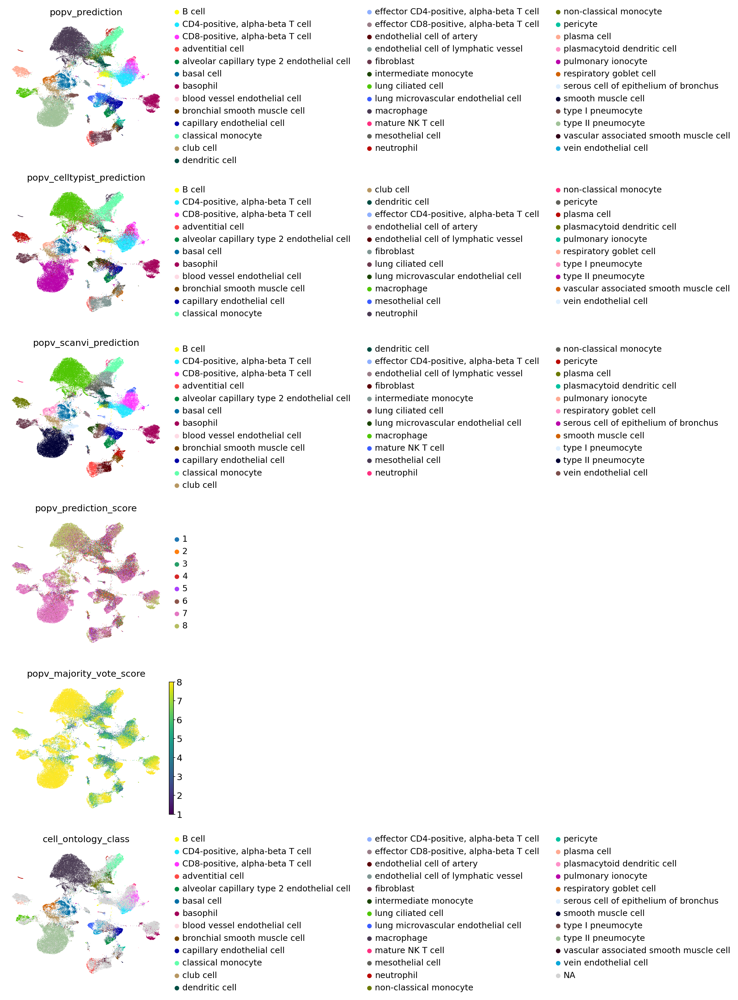

In [3]:
adata.obsm['X_umap'] = adata.obsm['X_scanvi_umap_popv']

sc.pl.umap(adata,
           color=['popv_prediction', 'popv_celltypist_prediction', 'popv_scanvi_prediction', 'popv_prediction_score', 'popv_majority_vote_score', 'cell_ontology_class'], ncols=1)

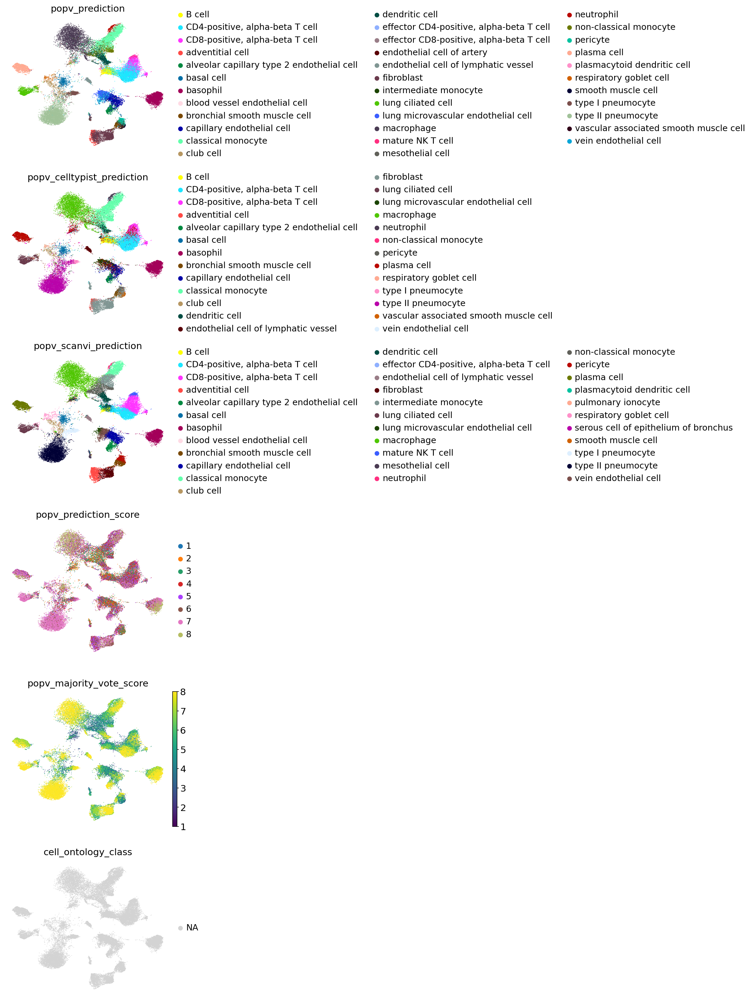

In [4]:
sc.pl.umap(adata[adata.obs['_dataset']=='query'],
           color=['popv_prediction', 'popv_celltypist_prediction', 'popv_scanvi_prediction', 'popv_prediction_score', 'popv_majority_vote_score', 'cell_ontology_class'], ncols=1)

In [8]:
query_adata = adata[adata.obs['_dataset']=='query']

In [10]:
def most_common(group):
    return group.mode().iloc[0]

def conditional_mode(group):
    mode_value = group.mode()
    if not mode_value.empty and (group == mode_value.iloc[0]).sum() / len(group) > 0.8:
        return mode_value.iloc[0]
    else:
        return None  # or pd.NA, depending on how you want to handle the absence of a valid mode

mapping = dict(query_adata.obs[['popv_prediction', 'original_ann_nonharmonized']].groupby('original_ann_nonharmonized')['popv_prediction'].apply(most_common))
mapping['DC EREG'] = 'dendritic cell'
mapping['CD8 M/E'] = 'CD8-positive, alpha-beta T cell'
mapping['AdvF (SFRP2+)'] = 'adventitial cell'
mapping['DC IGSF21'] = 'dendritic cell'
mapping['MKI67+ cells'] = 'unclassified'
mapping['MegaK'] = 'unclassified'
mapping['Vein_EC'] = 'vein endothelial cell'
mapping['Art_EC'] = 'endothelial cell of artery'
mapping['NK'] = 'mature NK T cell'

celltypes_mapping = pd.DataFrame.from_dict(mapping, orient='index')
celltypes_mapping['cell_counts'] = query_adata.obs['original_ann_nonharmonized'].value_counts()[celltypes_mapping.index]

print(celltypes_mapping.to_latex(index=True))

\begin{tabular}{llr}
\toprule
{} &                                           0 &  cell\_counts \\
\midrule
AM activated state        &                                  macrophage &         1508 \\
AM groundstate            &                                  macrophage &         2266 \\
AT-1 cells                &                           type I pneumocyte &          691 \\
AT-2 cells                &                          type II pneumocyte &         4439 \\
AdvF (PI16+)              &                            adventitial cell &          261 \\
AdvF (SFRP2+)             &                            adventitial cell &          391 \\
Art\_EC                    &                  endothelial cell of artery &          387 \\
B cells                   &                                      B cell &         1765 \\
Basal cells               &                                  basal cell &          558 \\
Bro\_EC                    &                  capillary endothelial cell &        

In [20]:
import pandas as pd
adata.obs['harmonized_celltype'] = [mapping[celltype] if not pd.isna(celltype) else None for celltype in adata.obs['original_ann_nonharmonized']]

... storing 'harmonized_celltype' as categorical


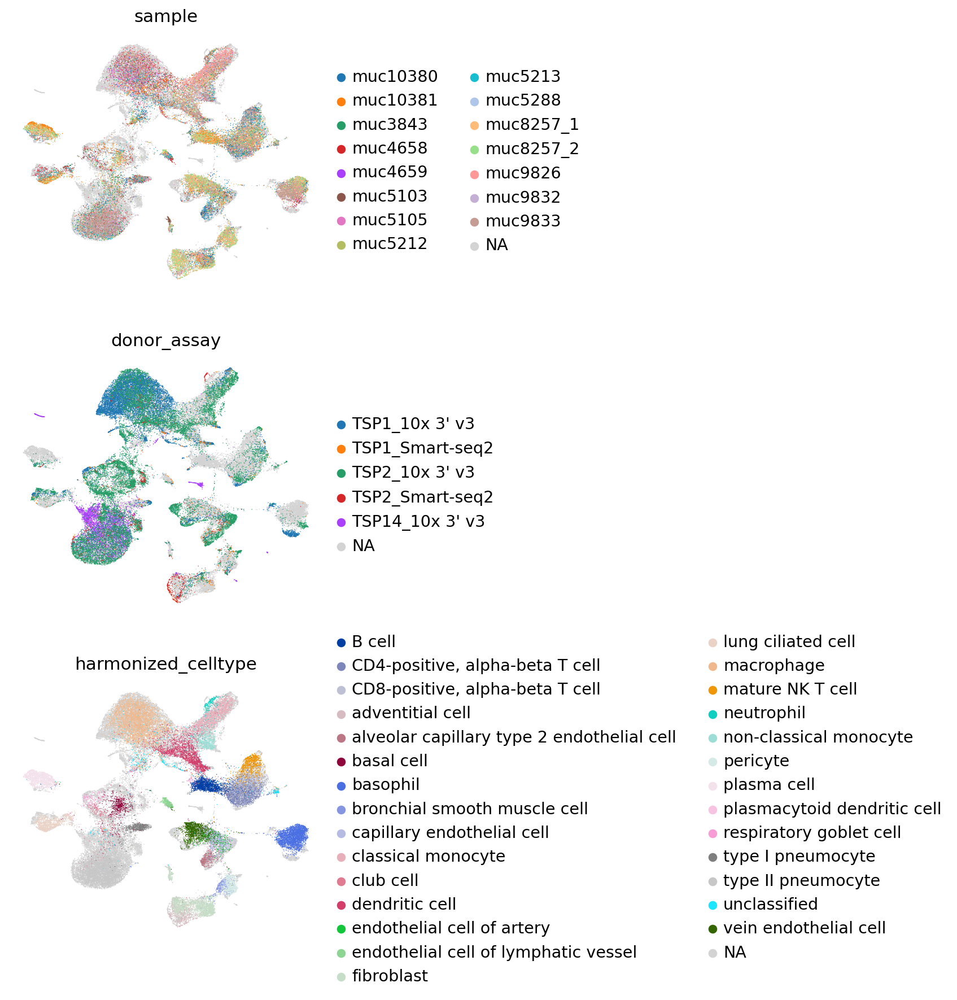

In [21]:
sc.pl.umap(
    adata, color=['sample', 'donor_assay', 'harmonized_celltype'], ncols=1)

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Disable grid lines globally
plt.rcParams["axes.grid"] = False

def _prediction_eval(
    df,
    pred_name,
    label_name,
    name,
    x_label="",
    y_label="",
    save_fig=None,
):
    pred = df[pred_name]
    labels = df[label_name]
    """Generate confusion matrix."""
    types, _ = np.unique(np.concatenate([labels, pred]), return_inverse=True)
    mtx = confusion_matrix(labels, pred, normalize="true")
    df = pd.DataFrame(mtx, columns=types, index=types)
    df = df.loc[np.unique(labels), np.unique(pred)]
    df = df.rename_axis(x_label, axis="columns")
    df = df.rename_axis(y_label)
    df = df[pred.value_counts().index[pred.value_counts()>10]]
    df = df.loc[labels.value_counts().index[labels.value_counts()>1]]
    positions = [df.columns.get_loc(index) for index in df.idxmax(axis=1)]
    df = df.loc[df.index[np.argsort(positions)]]
    
    fig, ax = plt.subplots(figsize=[15, 15])
    sns.heatmap(df.T, linewidths=0.005, cmap="OrRd", square=True)
    plt.tight_layout()
    plt.title(name)
    if not x_label:
        x_label = pred_name
    if not y_label:
        y_label = label_name
    plt.ylabel(pred_name)
    plt.xlabel(label_name)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    if save_fig:
        plt.savefig(save_fig)
    plt.show()

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 59 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'q', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 36, 37, 38, 39, 40, 41, 42, 44, 46, 47, 48, 49, 51, 53, 54, 55, 57, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 64 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'P

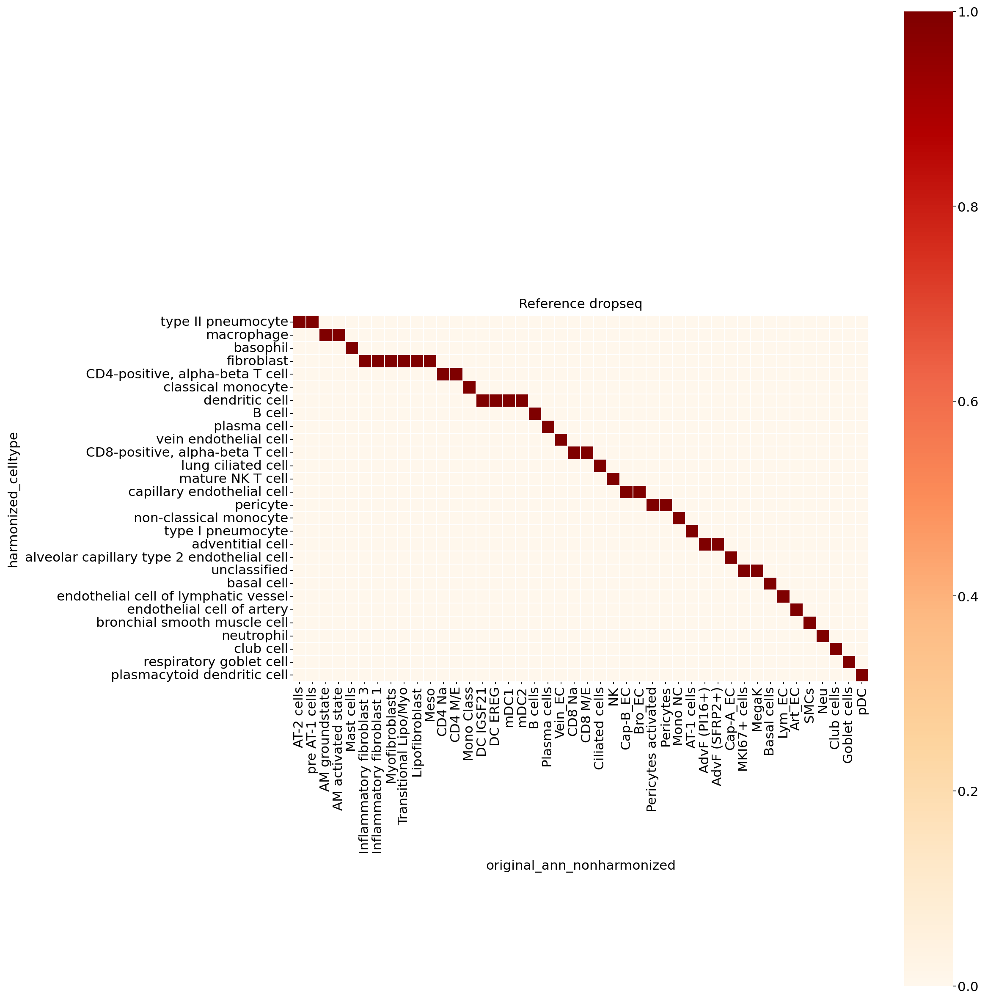

In [23]:
_prediction_eval(adata[adata.obs['_dataset']=='query'].obs, name='Reference dropseq', pred_name='harmonized_celltype', label_name='original_ann_nonharmonized', save_fig=f'{output_folder}/popv_translation_query.pdf')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 

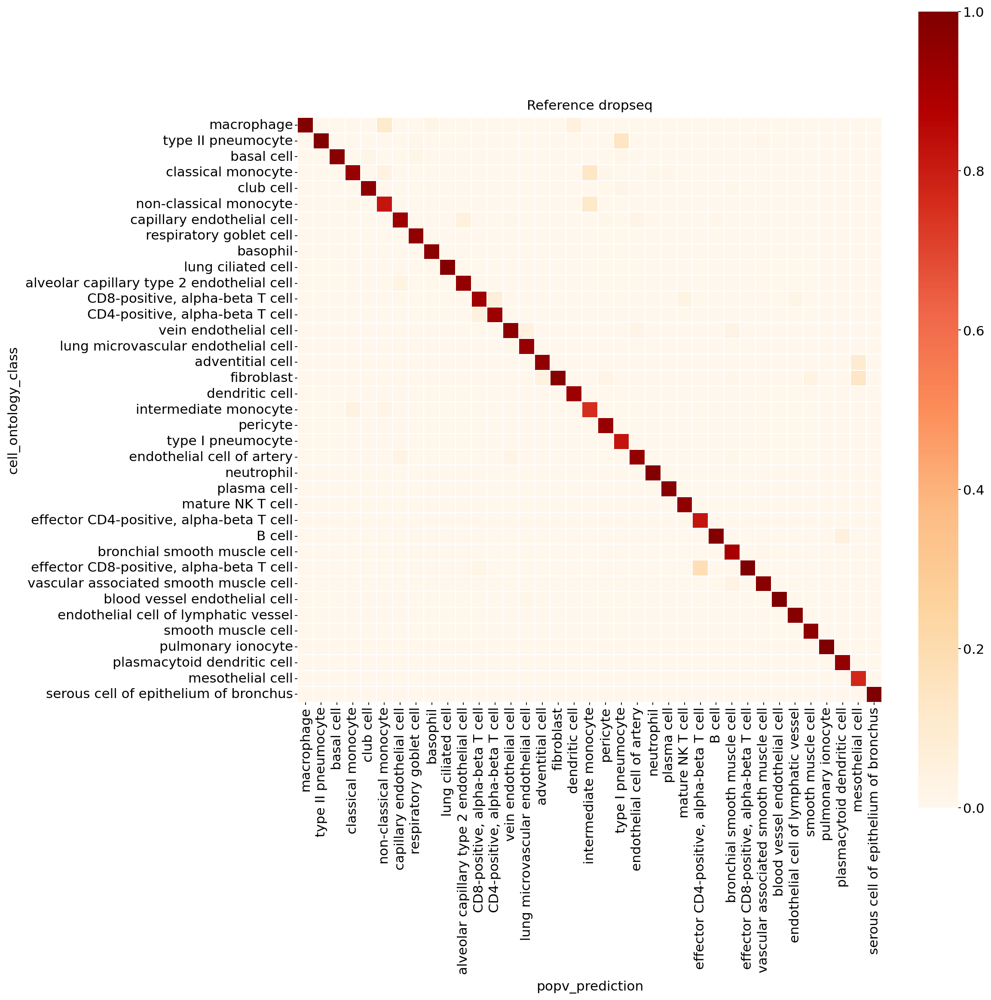

In [24]:
_prediction_eval(adata[adata.obs['_dataset']=='ref'].obs, name='Reference dropseq', pred_name='cell_ontology_class', label_name='popv_prediction', save_fig=f'{output_folder}/popv_agreement_dropseq_ref.pdf')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

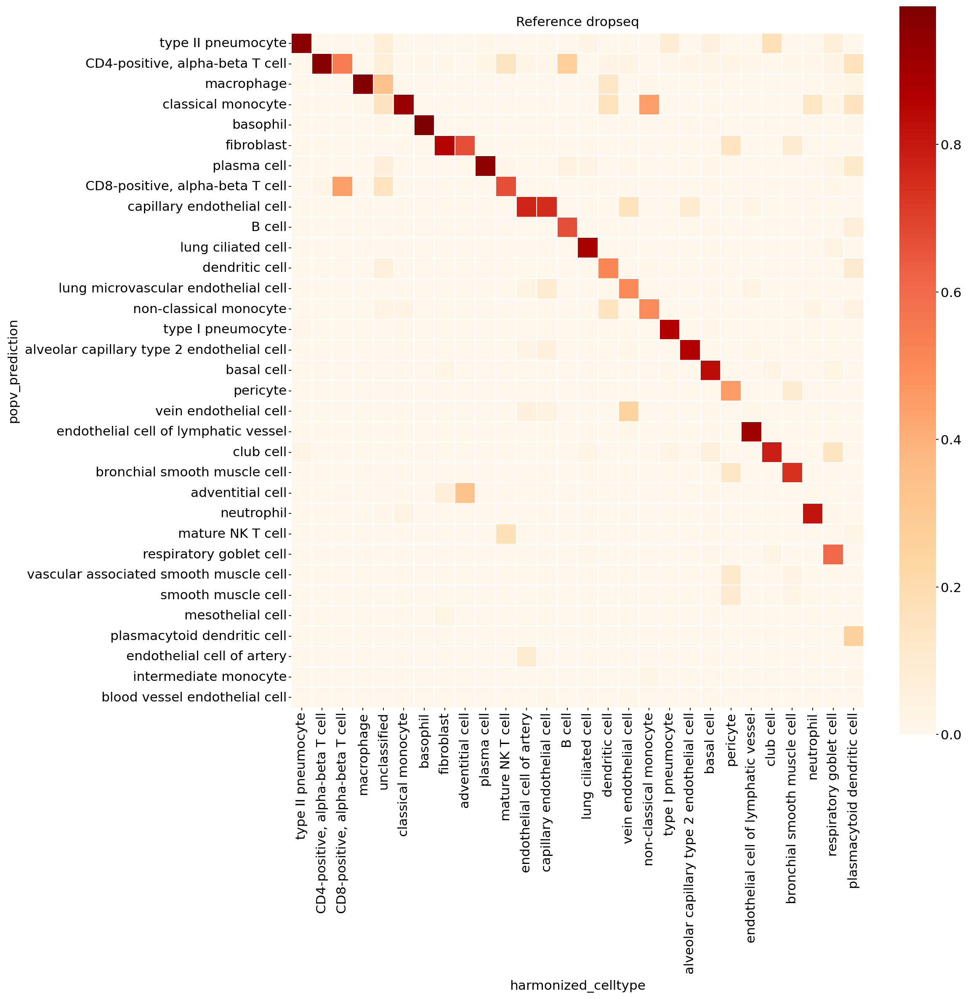

In [25]:
_prediction_eval(adata[adata.obs['_dataset']=='query'].obs, name='Reference dropseq', pred_name='popv_prediction', label_name='harmonized_celltype', save_fig=f'{output_folder}/popv_agreement_dropseq_query.pdf')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

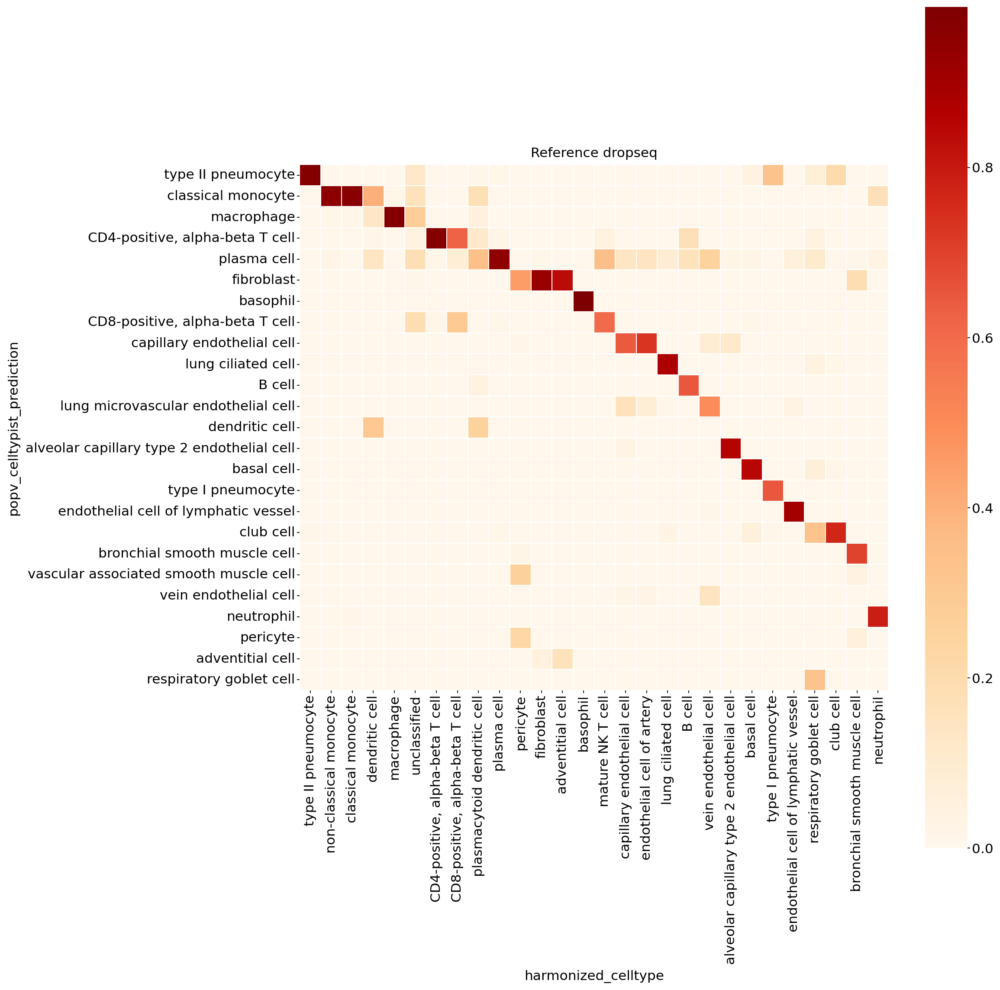

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 't

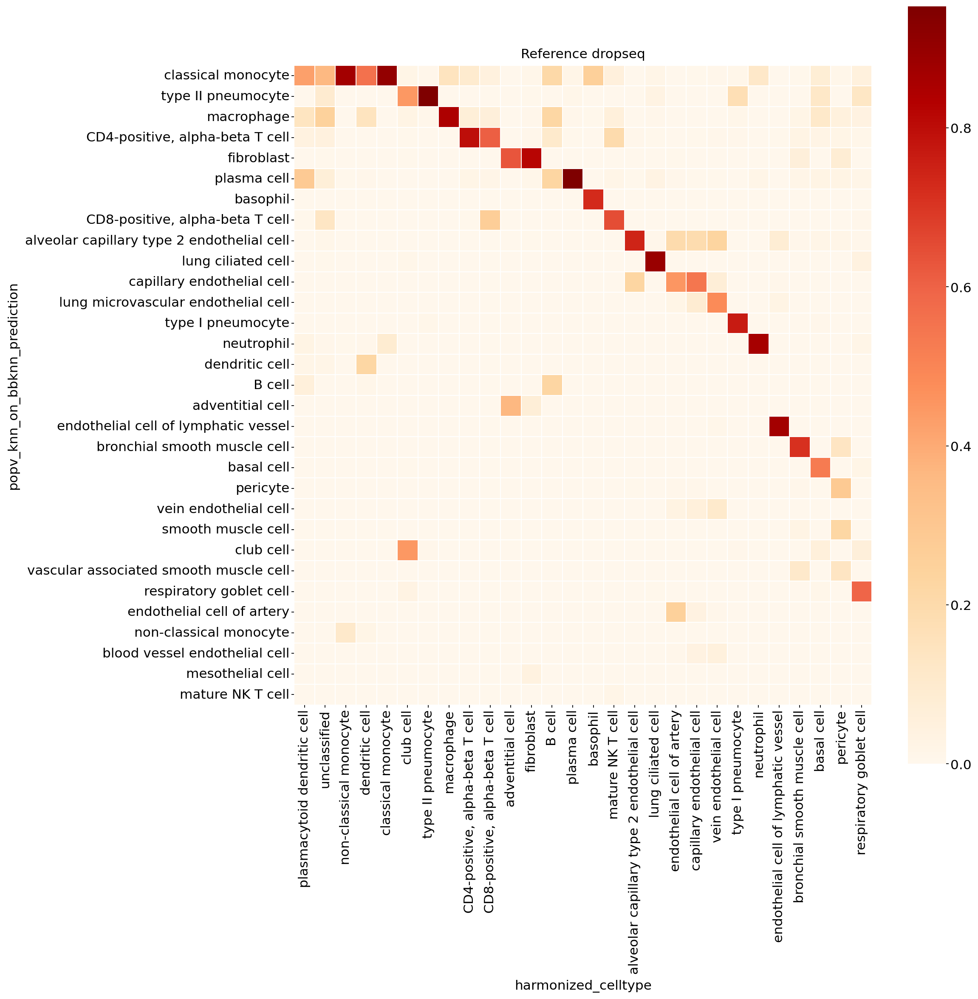

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 't

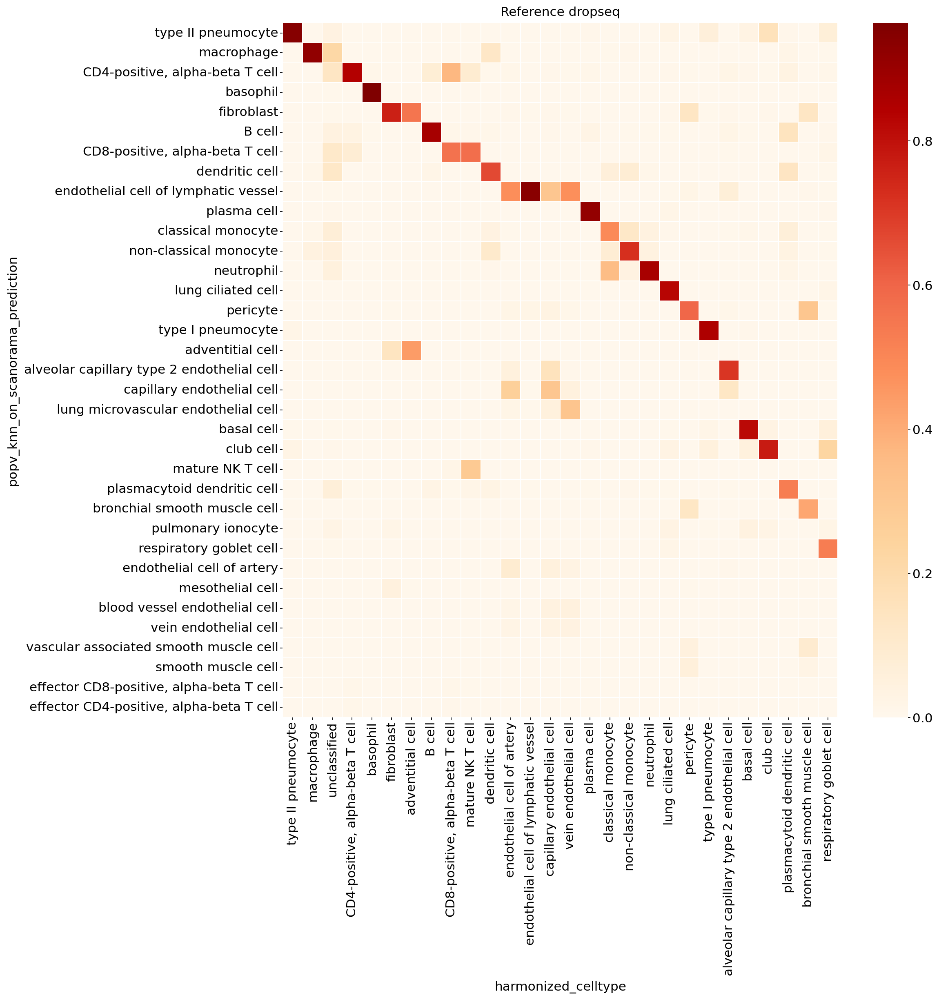

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 't

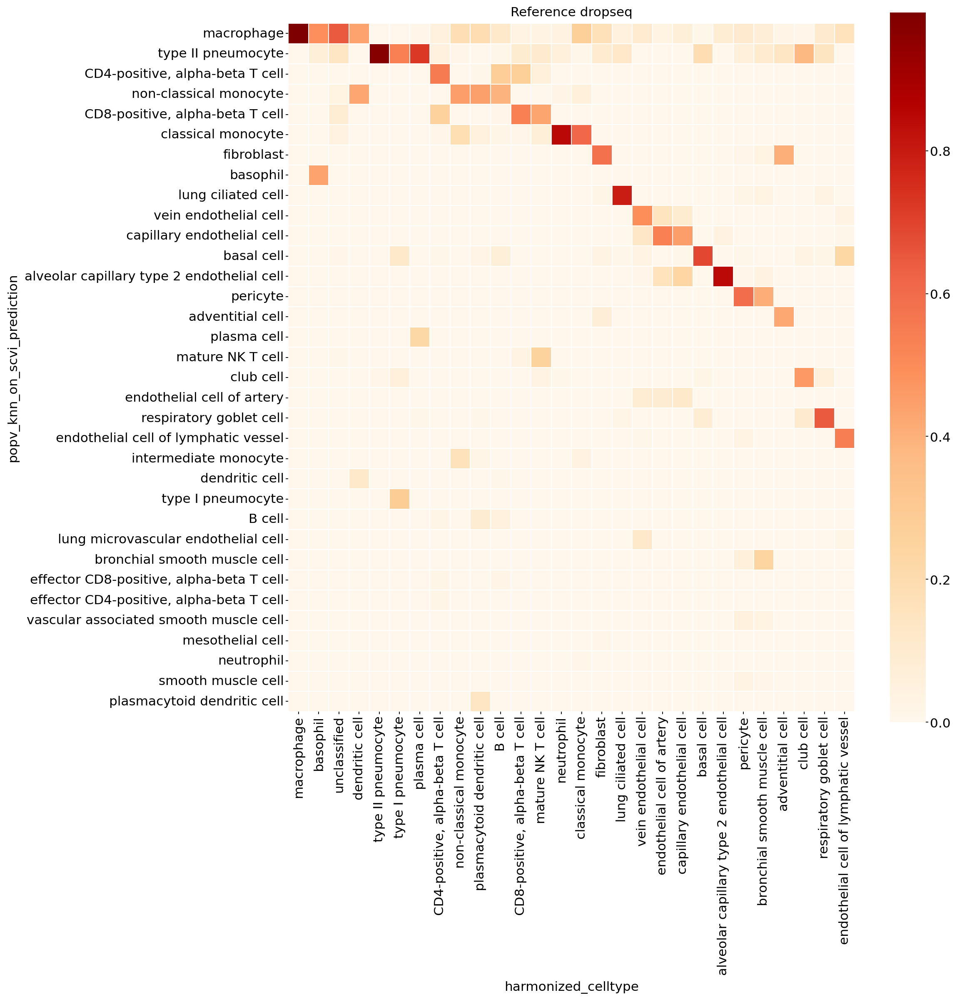

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 48 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'w', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 22, 23, 25, 27, 37, 38, 39, 42, 44, 46, 49, 53, 55, 59, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93]
Closed glyph list over 'GSUB': 53 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one',

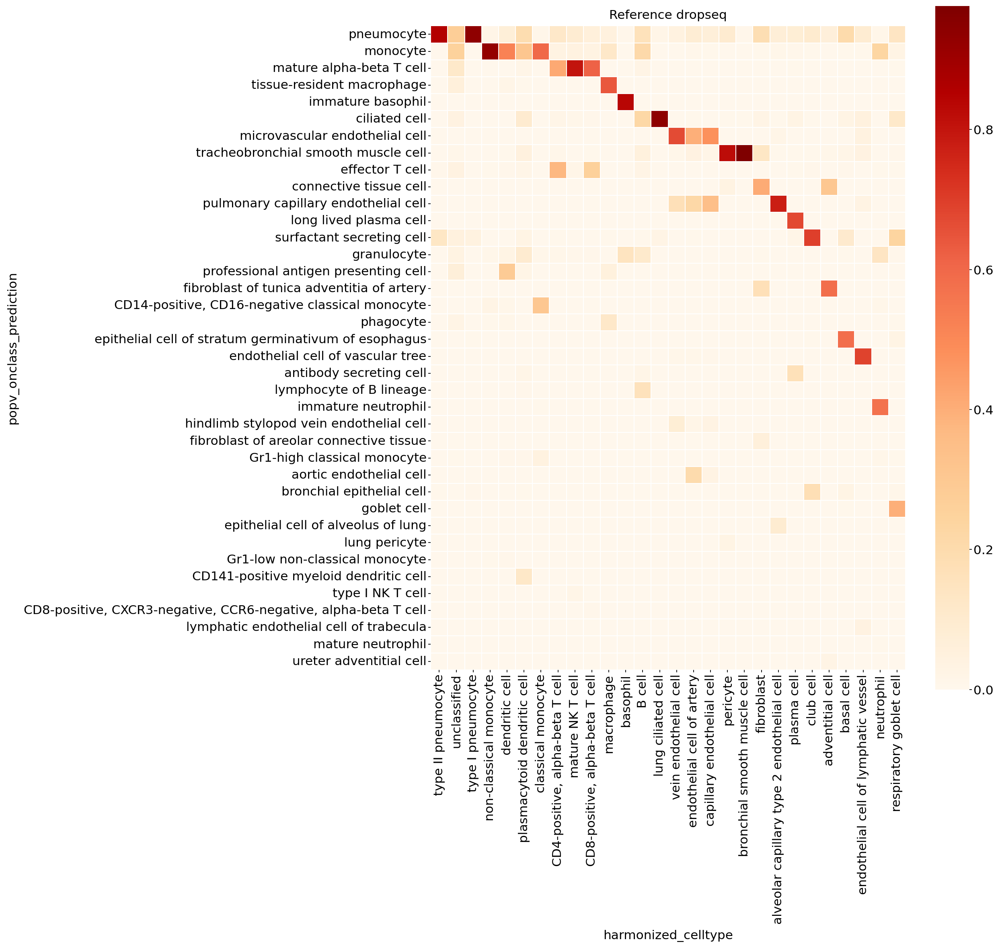

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

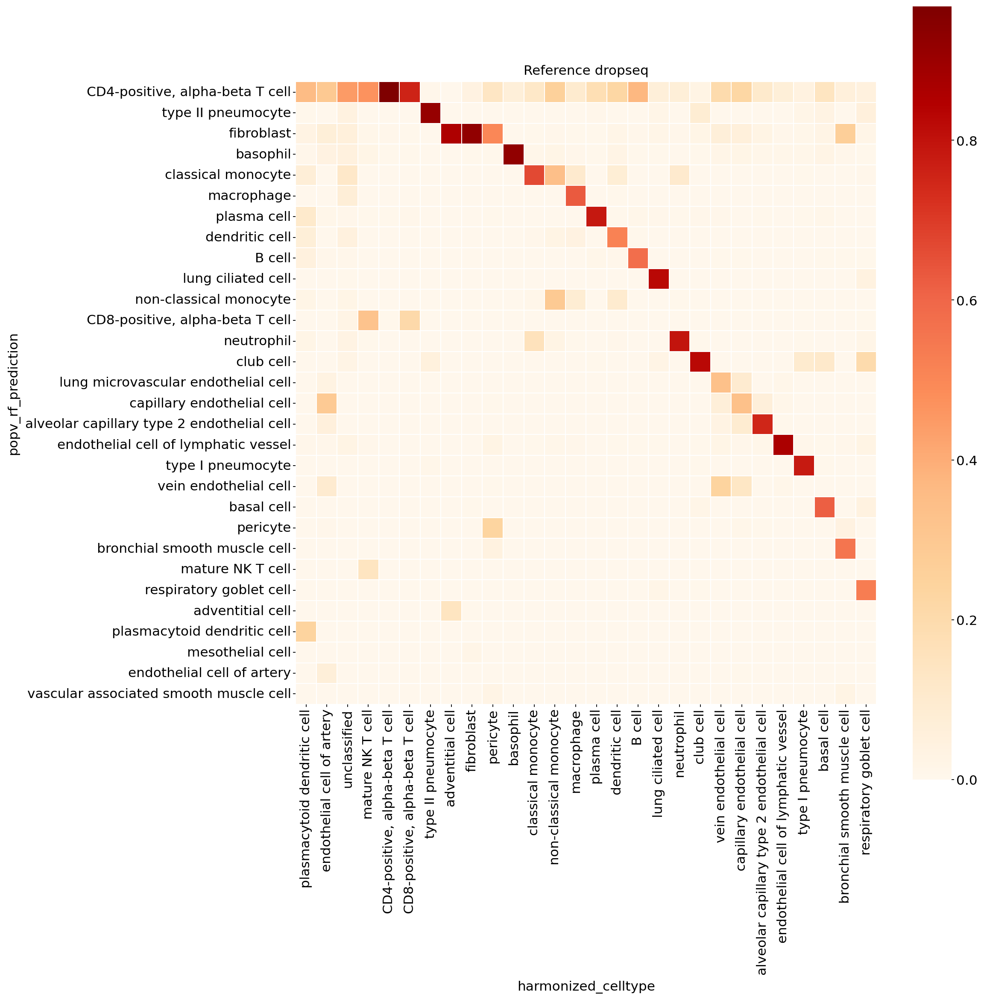

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

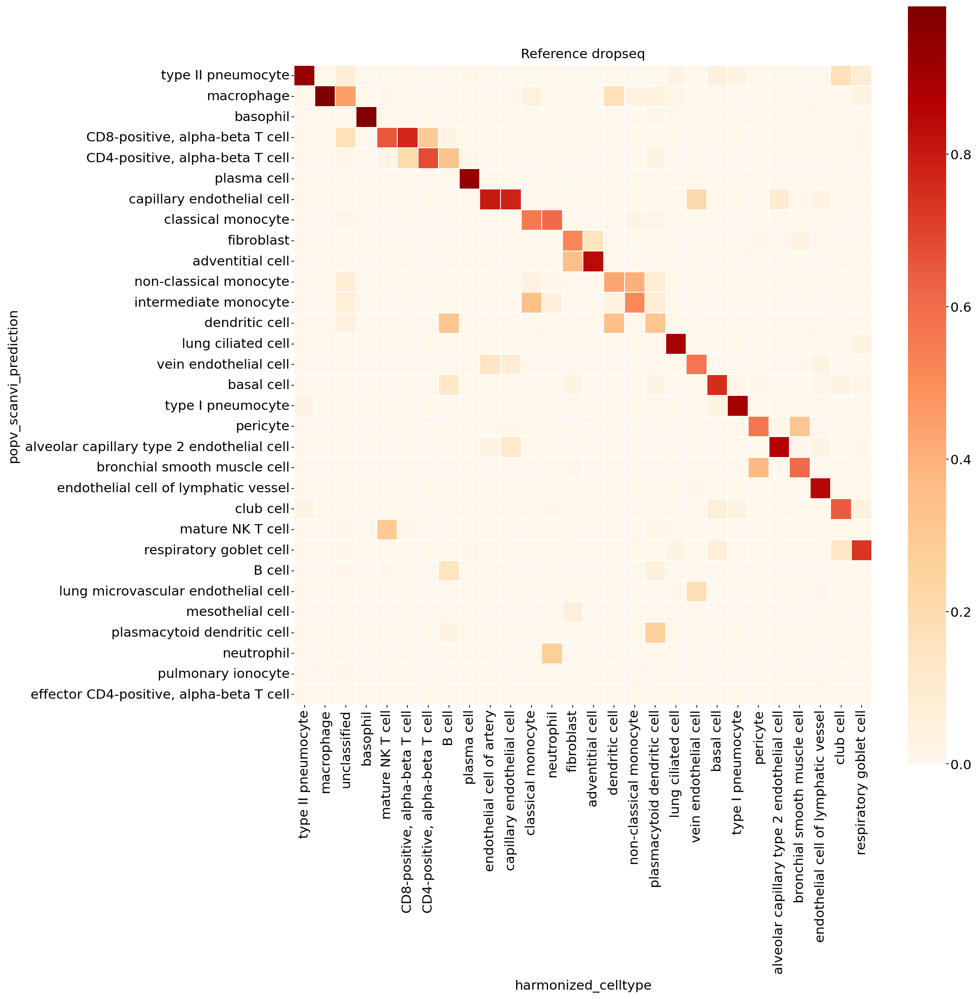

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

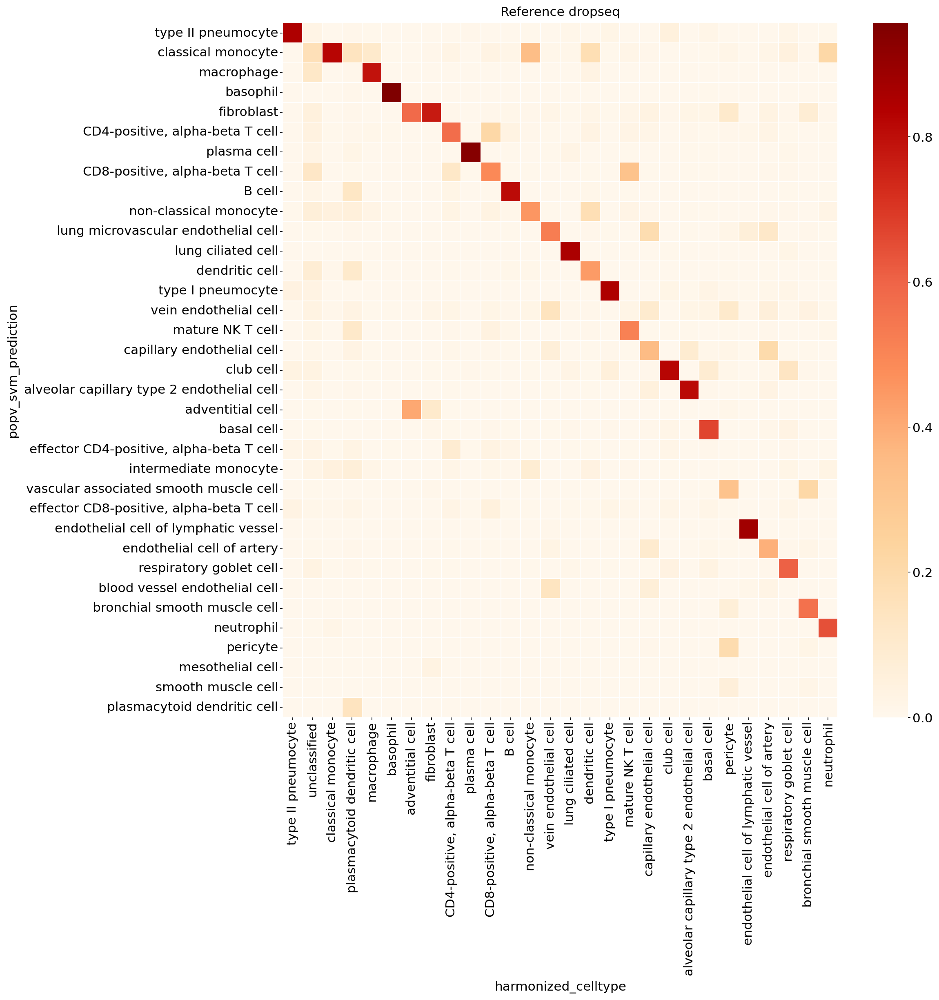

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'und

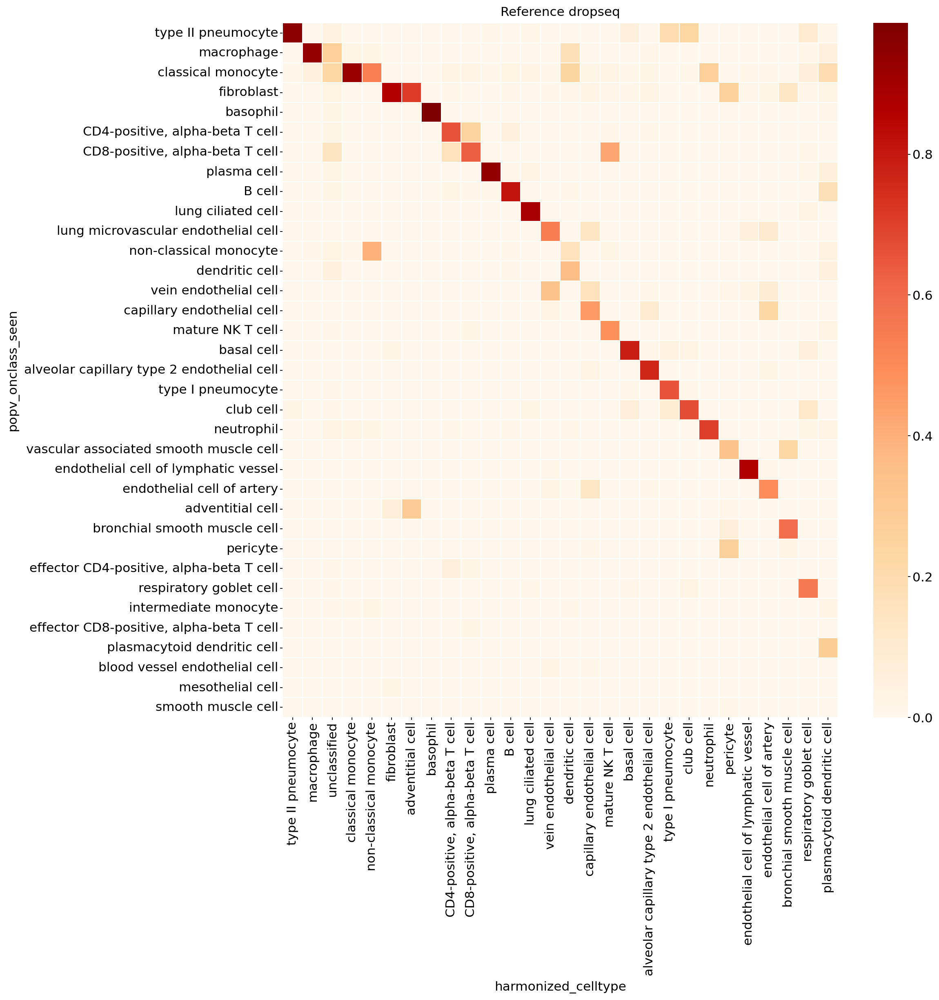

In [26]:
for pred in list(adata.uns['prediction_keys']) + ['popv_onclass_seen']:
    _prediction_eval(adata[adata.obs['_dataset']=='query'].obs, name='Reference dropseq', pred_name=pred, label_name='harmonized_celltype', save_fig=f'{output_folder}/{pred}_agreement_dropseq_query.pdf')

In [58]:
from popv.reproducibility import _accuracy

obo_fn = '/data/extra_files/galen_dropbox_figures/can_reproducibility/PopV/ontology/cl.obo'

G = popv._utils.make_ontology_dag(obo_fn)
pred_keys = adata.uns['prediction_keys']
query_adata = adata[np.logical_and(adata.obs['_dataset']=='query', adata.obs['harmonized_celltype']!='unclassified')]

_accuracy._ontology_accuracy(
    query_adata, 
    obofile=obo_fn,
    gt_key='harmonized_celltype', 
    pred_key='popv_prediction',
    save_key='consensus_ontology_accuracy')
for k in pred_keys:
    print(k)
    _accuracy._ontology_accuracy(
        query_adata,
        obofile=obo_fn,
        gt_key='harmonized_celltype', 
        pred_key=k,
        save_key=f'{k}_ontology_accuracy')

popv_celltypist_prediction
popv_knn_on_bbknn_prediction
popv_knn_on_scanorama_prediction
popv_knn_on_scvi_prediction
popv_onclass_prediction
popv_rf_prediction
popv_scanvi_prediction
popv_svm_prediction


In [59]:
accuracy_replace_dict = {'exact': 'Exact Match', 
                         'parent': 'Parent Match',
                         'child': "Child Match",
                         'sibling': 'Sibling Match',
                         'no match': 'No Match'
                        }

ontology_vote_cols = [s for s in query_adata.obs.keys() if s.endswith('ontology_accuracy')]

cat_order = [
    "Exact Match",
    "Parent Match",
    "Child Match",
    "Sibling Match",
    "No Match",
]

for s in ontology_vote_cols:
    print(s)
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[s].replace(accuracy_replace_dict)
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].astype('category')
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].cat.add_categories(set(cat_order)-set(query_adata.obs[f'{s}_annotated'].cat.categories))
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].values.reorder_categories(cat_order)

consensus_ontology_accuracy
popv_celltypist_prediction_ontology_accuracy
popv_knn_on_bbknn_prediction_ontology_accuracy
popv_knn_on_scanorama_prediction_ontology_accuracy
popv_knn_on_scvi_prediction_ontology_accuracy
popv_onclass_prediction_ontology_accuracy
popv_rf_prediction_ontology_accuracy
popv_scanvi_prediction_ontology_accuracy
popv_svm_prediction_ontology_accuracy


In [60]:
acc_annotated_cols = [s for s in query_adata.obs.keys() if s.endswith('_annotated')]

In [61]:
df = query_adata.obs[acc_annotated_cols].apply(pd.Series.value_counts).T


In [62]:
df

,Exact Match,Parent Match,Child Match,Sibling Match,No Match
consensus_ontology_accuracy_annotated,29334,36,1,3870,4832
popv_celltypist_prediction_ontology_accuracy_annotated,27394,47,0,4646,5986
popv_knn_on_bbknn_prediction_ontology_accuracy_annotated,24292,91,2,4811,8877
popv_knn_on_scanorama_prediction_ontology_accuracy_annotated,27760,107,116,3534,6556
popv_knn_on_scvi_prediction_ontology_accuracy_annotated,21352,4,56,5050,11611
popv_onclass_prediction_ontology_accuracy_annotated,0,17524,9056,2912,8581
popv_rf_prediction_ontology_accuracy_annotated,24939,13,0,4599,8522
popv_scanvi_prediction_ontology_accuracy_annotated,26855,66,6,5177,5969
popv_svm_prediction_ontology_accuracy_annotated,26068,260,306,3721,7718


In [63]:
acc_annotated_cols

['consensus_ontology_accuracy_annotated',
 'popv_celltypist_prediction_ontology_accuracy_annotated',
 'popv_knn_on_bbknn_prediction_ontology_accuracy_annotated',
 'popv_knn_on_scanorama_prediction_ontology_accuracy_annotated',
 'popv_knn_on_scvi_prediction_ontology_accuracy_annotated',
 'popv_onclass_prediction_ontology_accuracy_annotated',
 'popv_rf_prediction_ontology_accuracy_annotated',
 'popv_scanvi_prediction_ontology_accuracy_annotated',
 'popv_svm_prediction_ontology_accuracy_annotated']

In [64]:
query_adata.obs['popv_prediction_probabilities'] = query_adata.obs['popv_prediction_score'].astype(float)/query_adata.obs['popv_prediction_score'].astype(float).max()

In [65]:
query_adata

AnnData object with n_obs × n_vars = 38073 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'suspension_type', 'assay_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'origin

In [66]:
acc_annotated_cols_dict = {
    'consensus_ontology_accuracy_annotated': 'popv_prediction',
    'popv_celltypist_prediction_ontology_accuracy_annotated': 'popv_celltypist_prediction',
    'popv_knn_on_bbknn_prediction_ontology_accuracy_annotated': 'popv_knn_on_bbknn_prediction',
    'popv_knn_on_scanorama_prediction_ontology_accuracy_annotated': 'popv_knn_on_scanorama_prediction',
    'popv_knn_on_scvi_prediction_ontology_accuracy_annotated': 'popv_knn_on_scvi_prediction',
    'popv_rf_prediction_ontology_accuracy_annotated': 'popv_rf_prediction',
    'popv_svm_prediction_ontology_accuracy_annotated': 'popv_svm_prediction',
    'popv_scanvi_prediction_ontology_accuracy_annotated': 'popv_scanvi_prediction',
    'popv_onclass_prediction_ontology_accuracy_annotated': 'popv_onclass_prediction',
}

In [67]:
rename_dict = {
    'popv_prediction': 'popV',
    'popv_celltypist_prediction': 'Celltypist',
    'popv_knn_on_bbknn_prediction': 'KNN on BBKNN',
    'popv_knn_on_scanorama_prediction': 'KNN on Scanorama',
    'popv_knn_on_scvi_prediction': 'KNN on scVI',
    'popv_onclass_seen': 'OnClass (seen)',
    'popv_rf_prediction': 'Random Forest',
    'popv_svm_prediction': 'SVM',
    'seurat_prediction': 'Seurat',
    'popv_scanvi_prediction': 'scANVI',
    'popv_onclass_prediction': 'OnClass',
}

In [68]:
query_adatas = query_adata #[query_adata.obs['harmonized_celltype']!='T cell']

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 51 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'c', 'colon', 'd', 'e', 'eight', 'equal', 'f', 'five', 'four', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 37, 38, 41, 44, 46, 48, 49, 50, 51, 53, 54, 57, 68, 70, 71, 72, 73, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 56 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'c', 'colon', 'd', 'e', 'eight', 'equal', 'f', 'fi', 'five', 'fl'

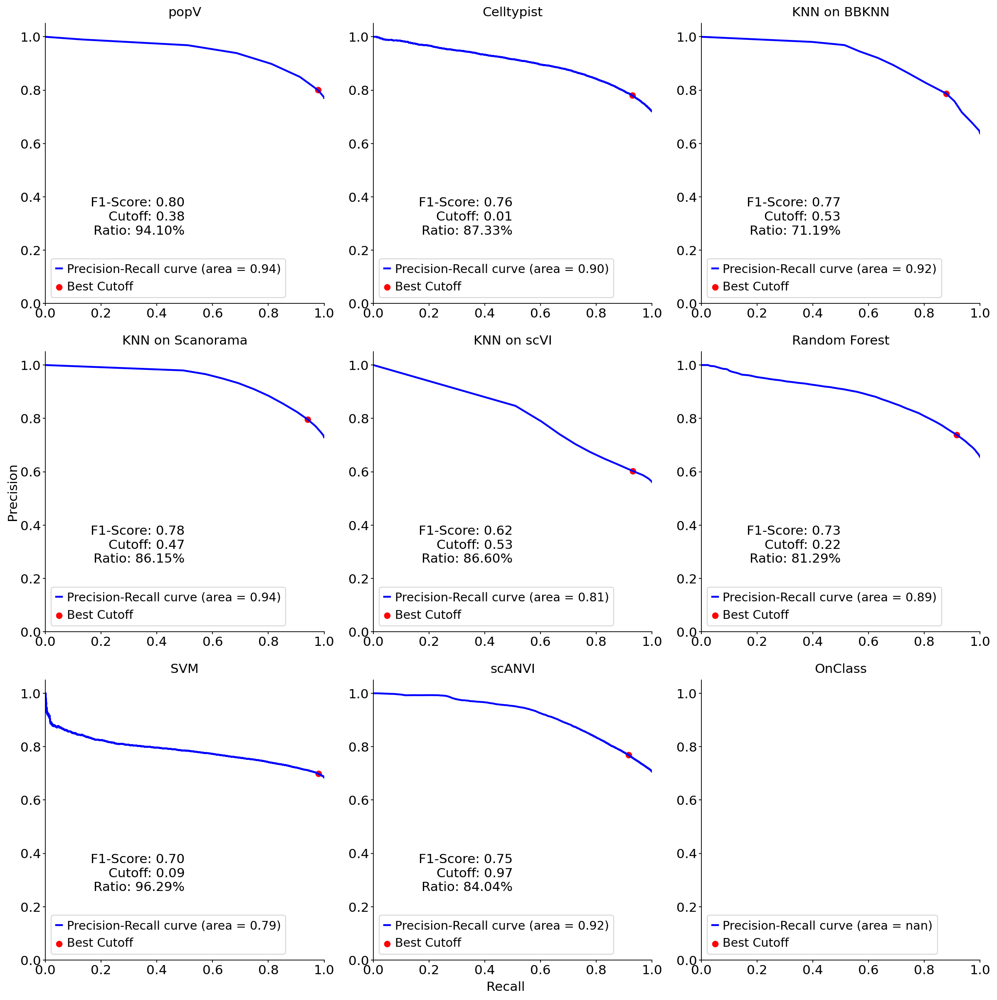

In [69]:
from sklearn.metrics import precision_recall_curve, auc, accuracy_score

scores = [1, 2, 3, 4, 5, 6, 7, 8]
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
idx = -1
for ontology_accuracy, prediction_key in acc_annotated_cols_dict.items():
    idx += 1
    
    y_val = query_adatas.obs[ontology_accuracy]=='Exact Match'
    probabilities = query_adatas.obs[prediction_key+'_probabilities']

    # Compute Precision-Recall curve and area under the curve
    precision, recall, thresholds = precision_recall_curve(y_val, probabilities)
    pr_auc = auc(recall, precision)

    # Calculate the F1 score to find the best threshold (cutoff)
    f1_scores = 2*recall*precision / (recall + precision + 1e-3)
    best_idx = np.argmax(f1_scores)
    best_cutoff = thresholds[best_idx]

    # Apply the best cutoff to make final predictions
    predictions = np.where(probabilities > (best_cutoff - 1e-3), 1, 0)

    # Calculate the accuracy of predictions above the cutoff
    accuracy_above_cutoff = accuracy_score(y_val, predictions)
    axs_ = axs[idx//3, idx%3]
    
    axs_.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
    axs_.scatter(recall[best_idx], precision[best_idx], marker='o', color='red', label='Best Cutoff')
    axs_.annotate(f'F1-Score: {accuracy_above_cutoff:.2f}\nCutoff: {best_cutoff:.2f}\nRatio: {(np.mean(predictions) * 100):.2f}%',
                xy=(recall[best_idx], precision[best_idx]), xytext=(0.5, 0.4),
                horizontalalignment='right', verticalalignment='top')
    axs_.legend(loc="lower left")
    axs_.set_title(rename_dict[prediction_key])
    axs_.set_xlim([0.0, 1.0])
    axs_.set_ylim([0.0, 1.05])

    #axs_.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),ncol=3)
    #plt.savefig(f'fig4/fig4_thymus_prediction_accuracy_{prediction_key}.pdf', bbox_inches='tight')
#axs[-1, -1].axis('off')
fig.text(0.5, 0, 'Recall', ha='center')
fig.text(0, 0.5, 'Precision', va='center', rotation='vertical')
fig.tight_layout()
plt.savefig(f'{output_folder}/dropseq_precision_recall.pdf', bbox_inches='tight')
plt.show()


In [39]:
parent = 'Parent Match'
child = 'Child Match'
exact = 'Exact Match'
sibling = 'Sibling Match'

color_map = ['#1f77b4',
             '#2ca02c',
             '#9467bd',
             '#ff7f0e',
             '#d62728',
             '#8c564b',
             '#e377c2',
             '#7f7f7f',
             '#bcbd22',
             '#17becf']

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 53 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 32, 36, 37, 38, 40, 41, 44, 46, 48, 49, 50, 51, 53, 54, 57, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
Closed glyph list over 'GSUB': 58 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'equal', 'f', 'fi', 'f

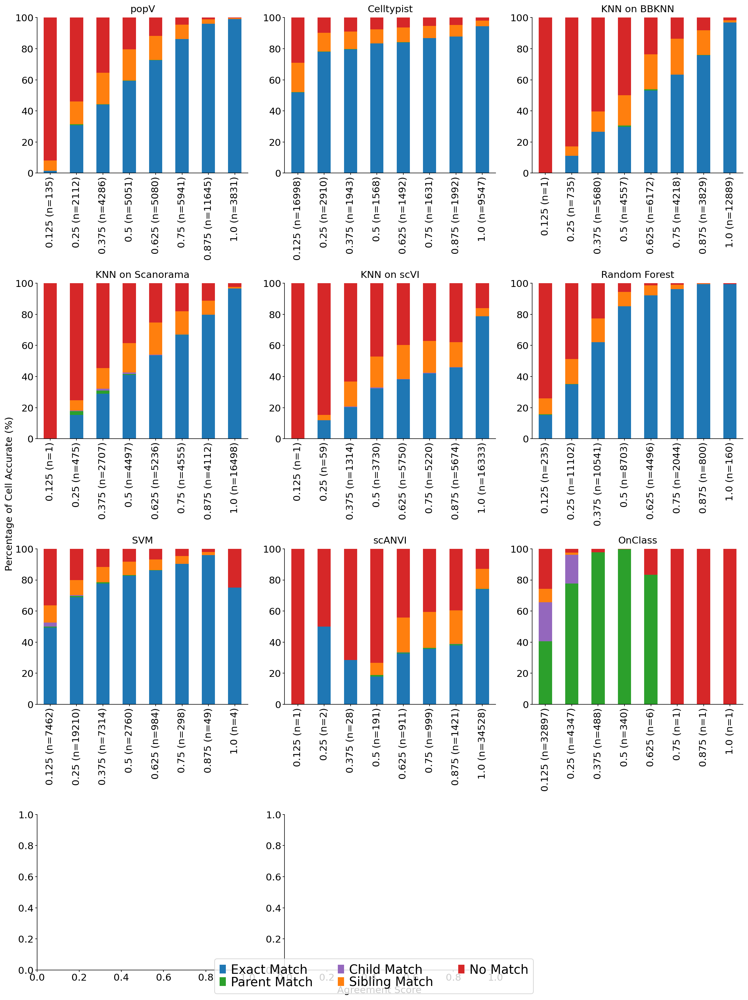

In [40]:
scores = [1, 2, 3, 4, 5, 6, 7, 8]
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
idx = -1
for ontology_accuracy, prediction_key in acc_annotated_cols_dict.items():
    idx += 1
    exact_acc = []
    parent_acc = []
    child_acc = []
    sibling_acc = []
    neighborhood_acc = []
    ns = []
    for score in scores:
        df = query_adatas.obs[[prediction_key+'_probabilities', ontology_accuracy]]
        tmp = df[np.logical_and(df[prediction_key+'_probabilities']>(score-1)/np.max(scores), df[prediction_key+'_probabilities']<=score/np.max(scores))]
        n = tmp.shape[0] + 1
        
        ns.append(n)
        
        correct1 = tmp[tmp[ontology_accuracy] == exact].shape[0]
        exact_acc.append(correct1/n)
        
        correct2 = tmp[tmp[ontology_accuracy] == parent].shape[0]
        parent_acc.append(correct2/n)
        
        correct3 = tmp[tmp[ontology_accuracy] == child].shape[0]
        child_acc.append(correct3/n)
        
        correct4 = tmp[tmp[ontology_accuracy] == sibling].shape[0]
        sibling_acc.append(correct4/n)
        
        neighborhood_score = (correct1+correct2+correct3+correct4)/n
        neighborhood_acc.append(neighborhood_score)
    
    labels = [f'{s} (n={n})' for s,n in zip(scores/np.max(scores), ns)]
    df = pd.DataFrame(index = labels)
    df['Exact Match'] = exact_acc * np.array(ns) #/ np.sum(ns)
    df['Parent Match'] = parent_acc * np.array(ns) #/ np.sum(ns)
    df['Child Match'] = child_acc * np.array(ns) #/ np.sum(ns)
    df['Sibling Match'] = sibling_acc * np.array(ns) #/ np.sum(ns)
    df['No Match'] =  (np.array(ns) - df.sum(axis=1)) #/ np.sum(ns)
    df = 100 * df.div(df.sum(axis=1), axis=0)
    axs_ = axs[idx//3, idx%3]
    df.plot.bar(stacked=True, color=color_map, ax=axs_, legend=False)
    axs_.set_ylim(0, 100)
    
    axs_.set_title(rename_dict[prediction_key])

    #axs_.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),ncol=3)
    #plt.savefig(f'fig4/fig4_thymus_prediction_accuracy_{prediction_key}.pdf', bbox_inches='tight')
axs[-1, -1].axis('off')

handles, labels = axs_.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, labelspacing=0., prop={'size': 18})

fig.text(0.5, 0, 'Agreement Score', ha='center')
fig.text(0, 0.5, 'Percentage of Cell Accurate (%)', va='center', rotation='vertical')
fig.tight_layout()
plt.savefig(f'{output_folder}/dropseq_score_accuracy.pdf', bbox_inches='tight')
plt.show()


In [41]:
query_adata.raw

... storing 'consensus_ontology_accuracy' as categorical
... storing 'popv_celltypist_prediction_ontology_accuracy' as categorical
... storing 'popv_knn_on_bbknn_prediction_ontology_accuracy' as categorical
... storing 'popv_knn_on_scanorama_prediction_ontology_accuracy' as categorical
... storing 'popv_knn_on_scvi_prediction_ontology_accuracy' as categorical
... storing 'popv_onclass_prediction_ontology_accuracy' as categorical
... storing 'popv_rf_prediction_ontology_accuracy' as categorical
... storing 'popv_scanvi_prediction_ontology_accuracy' as categorical
... storing 'popv_svm_prediction_ontology_accuracy' as categorical


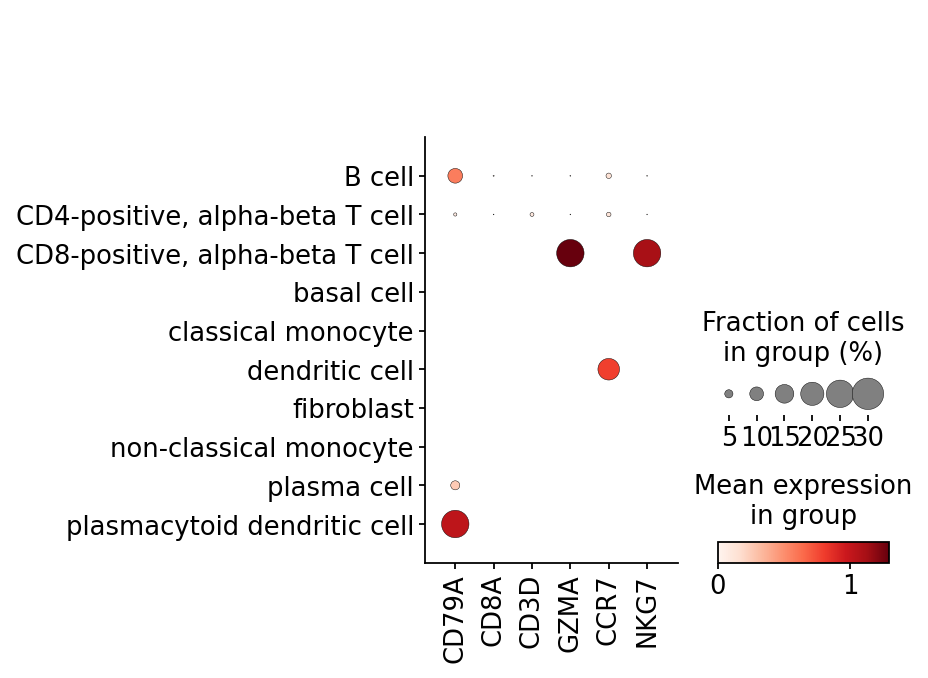

In [42]:
sc.pl.dotplot(query_adata[query_adata.obs['harmonized_celltype']=='B cell'], var_names=['CD79A', 'CD8A', 'CD3D', 'GZMA', 'CCR7', 'NKG7'], groupby='popv_prediction', use_raw=False)

In [43]:
query_adata[np.logical_and(query_adata.obs['popv_prediction_score'].astype(int)>5, query_adata.obs['consensus_ontology_accuracy_annotated']=='No Match')].obs[['popv_prediction', 'harmonized_celltype']].value_counts()

popv_prediction                       harmonized_celltype        
lung microvascular endothelial cell   vein endothelial cell          115
capillary endothelial cell            endothelial cell of artery      51
CD4-positive, alpha-beta T cell       B cell                          21
classical monocyte                    dendritic cell                  15
endothelial cell of lymphatic vessel  vein endothelial cell           15
                                                                    ... 
lung microvascular endothelial cell   dendritic cell                   1
basal cell                            club cell                        1
macrophage                            plasmacytoid dendritic cell      1
mesothelial cell                      adventitial cell                 1
B cell                                plasma cell                      1
Length: 68, dtype: int64

In [44]:
df = query_adata.obs[acc_annotated_cols].apply(pd.Series.value_counts).T

In [45]:
df = df / df.sum(1)[0]

In [46]:
df = df.sort_values('Exact Match', ascending=False)

In [47]:
df

,Exact Match,Parent Match,Child Match,Sibling Match,No Match
consensus_ontology_accuracy_annotated,0.770467,0.000946,0.000026,0.101647,0.126914
popv_knn_on_scanorama_prediction_ontology_accuracy_annotated,0.729126,0.002810,0.003047,0.092822,0.172196
popv_celltypist_prediction_ontology_accuracy_annotated,0.719513,0.001234,0.000000,0.122029,0.157224
popv_scanvi_prediction_ontology_accuracy_annotated,0.705356,0.001734,0.000158,0.135976,0.156778
popv_svm_prediction_ontology_accuracy_annotated,0.684685,0.006829,0.008037,0.097733,0.202716
popv_rf_prediction_ontology_accuracy_annotated,0.655031,0.000341,0.000000,0.120794,0.223833
popv_knn_on_bbknn_prediction_ontology_accuracy_annotated,0.638037,0.002390,0.000053,0.126363,0.233157
popv_knn_on_scvi_prediction_ontology_accuracy_annotated,0.560817,0.000105,0.001471,0.132640,0.304967
popv_onclass_prediction_ontology_accuracy_annotated,0.000000,0.460274,0.237859,0.076485,0.225383


In [48]:
[s.split('_')[:-3] for s in df.index]

[['consensus'],
 ['popv', 'knn', 'on', 'scanorama', 'prediction'],
 ['popv', 'celltypist', 'prediction'],
 ['popv', 'scanvi', 'prediction'],
 ['popv', 'svm', 'prediction'],
 ['popv', 'rf', 'prediction'],
 ['popv', 'knn', 'on', 'bbknn', 'prediction'],
 ['popv', 'knn', 'on', 'scvi', 'prediction'],
 ['popv', 'onclass', 'prediction']]

In [49]:
df.index = ['_'.join([i for i in s.split('_')[:-3] if i!='prediction']) for s in df.index]

In [50]:
rename_dict = {
    'consensus': 'PopV',
    'popv_celltypist': 'Celltypist',
    'popv_knn_on_scanorama': 'Scanorama + KNN',
    'popv_knn_on_scvi': 'scVI + KNN',
    'popv_scanvi': 'scANVI',
    'popv_knn_on_bbknn': 'BBKNN + KNN',
    'popv_rf': 'Random Forest',
    'seurat': 'Seurat',
    'popv_onclass': 'OnClass',
    'popv_onclass_seen': 'OnClass_seen',
    'popv_svm': 'SVM'}

In [51]:
df = df.rename(index=rename_dict)

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 45 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'six', 'space', 't', 'two', 'u', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 21, 23, 25, 27, 36, 37, 38, 40, 41, 44, 46, 48, 49, 50, 51, 53, 54, 57, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
Closed glyph list over 'GSUB': 45 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'six', 'space', 't', 'two', 

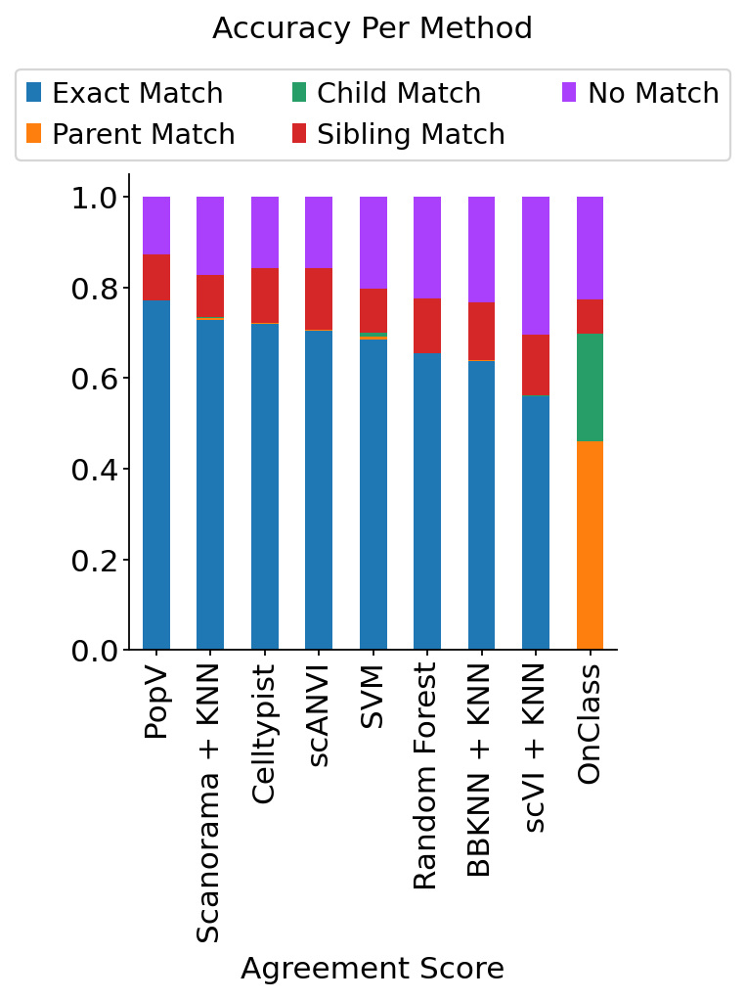

In [52]:
ax = df.plot.bar(stacked=True)

ax.set_xlabel('Agreement Score')
ax.set_title('Accuracy Per Method', y=1.25)

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.25),ncol=3)

plt.savefig(f'{output_folder}/popv_accuracy_per_method.pdf', bbox_inches='tight')


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'six', 'space', 't'

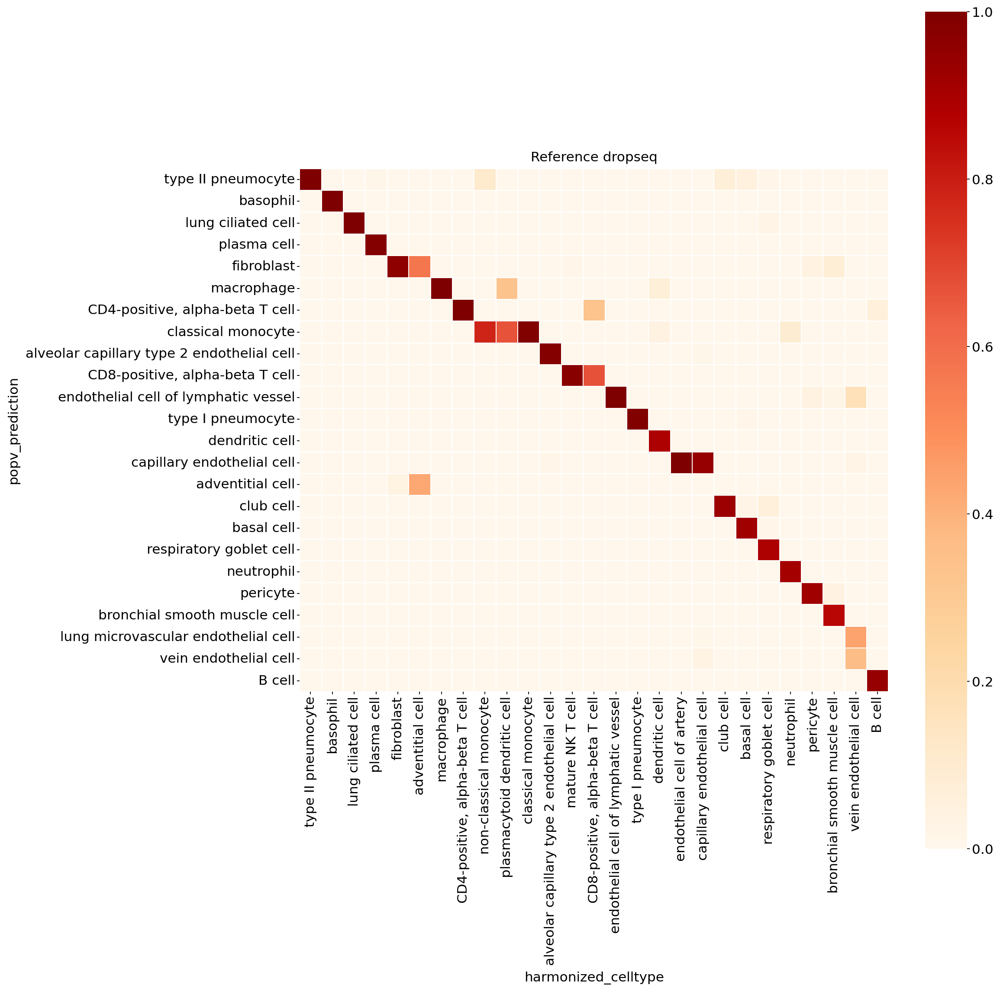

In [53]:
_prediction_eval(query_adata[query_adata.obs['popv_prediction_score'].astype(int)==7].obs, name='Reference dropseq', pred_name='popv_prediction', label_name='harmonized_celltype', save_fig=f'{output_folder}/popv_agreement_dropseq_query_certain.pdf')

In [54]:
from sklearn.metrics import f1_score

y_true = query_adata.obs['harmonized_celltype']
f1_df = pd.DataFrame(columns = ['macro', "micro", "weighted"])
pred_keys = list(query_adata.uns['prediction_keys']) + ['popv_prediction']

for key in pred_keys:
    y_pred = list(query_adata.obs[key])
    f1_macro = f1_score(y_true, y_pred, average='macro')
    f1_micro = f1_score(y_true, y_pred, average='micro')
    f1_weighted = f1_score(y_true, y_pred, average='weighted')
    f1_df.loc[key] = [f1_macro, f1_micro,f1_weighted]

f1_df.sort_values(by='weighted', ascending=False)

,macro,micro,weighted
popv_prediction,0.532098,0.770467,0.766232
popv_knn_on_scanorama_prediction,0.467370,0.729126,0.733111
popv_scanvi_prediction,0.477506,0.705356,0.711410
popv_svm_prediction,0.486302,0.684685,0.711248
popv_celltypist_prediction,0.546845,0.719513,0.688122
popv_rf_prediction,0.483324,0.655031,0.656818
popv_knn_on_bbknn_prediction,0.449274,0.638037,0.621382
popv_knn_on_scvi_prediction,0.353984,0.560817,0.537974
popv_onclass_prediction,0.000000,0.000000,0.000000


In [55]:
f1_df.to_csv(f'{output_folder}/f1_scores.csv')

In [56]:
df

,Exact Match,Parent Match,Child Match,Sibling Match,No Match
PopV,0.770467,0.000946,0.000026,0.101647,0.126914
Scanorama + KNN,0.729126,0.002810,0.003047,0.092822,0.172196
Celltypist,0.719513,0.001234,0.000000,0.122029,0.157224
scANVI,0.705356,0.001734,0.000158,0.135976,0.156778
SVM,0.684685,0.006829,0.008037,0.097733,0.202716
Random Forest,0.655031,0.000341,0.000000,0.120794,0.223833
BBKNN + KNN,0.638037,0.002390,0.000053,0.126363,0.233157
scVI + KNN,0.560817,0.000105,0.001471,0.132640,0.304967
OnClass,0.000000,0.460274,0.237859,0.076485,0.225383
